In [1]:
import sys
import os
from glob import glob
import pandas as pd
import spatialproteomics
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import tifffile
import scanpy as sc
import anndata as ad
import warnings
import seaborn as sns
warnings.filterwarnings("ignore")

import gc
gc.collect() 

100

In [2]:
# 1. Grab the exact reference spatialproteomics is using
orig_relabel = spatialproteomics.la.label.relabel_sequential


# 2. Build the wrapper that forces a mutable memory array copy
def writeable_relabel_sequential(label_field, offset=1):
    # Convert whatever xarray/numpy memory view into a standard writeable array
    label_field_copy = np.array(label_field, copy=True, order="C")
    label_field_copy.setflags(write=True)
    return orig_relabel(label_field_copy, offset=offset)


# 3. Patch the function inside BOTH modules where it's used
spatialproteomics.la.label.relabel_sequential = writeable_relabel_sequential
if hasattr(spatialproteomics.la, "label_accessor"):
    spatialproteomics.la.label_accessor.relabel_sequential = (
        writeable_relabel_sequential
    )


In [3]:
anndata=sc.read_h5ad('../data/CODEX/final_data/CODEX_run45_anndata_final.h5ad')

In [4]:
dat = { f.split('/')[-1].split('.')[0]: xr.open_zarr(f) for f in glob("../data/CODEX/final_data/zarr/*.zarr") }

In [5]:
channels=list(dat['test_Thpo'].channels.to_dataframe().index)
channels

['DAPI',
 '33 CD45',
 '80 Sca1',
 '128 Na K ATPase',
 '38 Ter119',
 '32 CD31',
 '149 Endomucin',
 '11 aSMA',
 '40 Podoplanin',
 '84 NCAM',
 '82 Vimentin',
 '51 CD146',
 'Osteopontin 166',
 '29 CD106',
 '158 VE Cadherin',
 '127 CD61',
 '103 CXCL12',
 'CD71 133',
 'Col1a 19']

In [6]:
list(dat.keys())

['test_EV', 'test_Thpo']

In [7]:
run='run46'
condition_vecs={'run46':['EV', 'Thpo']}

In [8]:
# 1. Pull the labels into memory (compute) so they can be used for indexing
labels = dat['test_Thpo']._obs.sel(features='_labels').compute()

In [9]:
pd.DataFrame(dat['test_Thpo']._obs)[0].value_counts()

0
2.0    12416
1.0      434
Name: count, dtype: int64

In [10]:
anndata.obs.head()

,orig.ident,total_arcsinh_intensity_bgFilt,nFeature,condition,sample,run,total_arcsinh_intensity_bgFilt_SCT,nFeature_SCT,SCT_snn_res.0.2,seurat_clusters,SCT_snn_res.0.1,SCT_snn_res.0.3,SCT_snn_res.0.4,SCT_snn_res.0.5,mask,clusters_named,Spp1_pos
0_run46_EV_1,CODEX_fusion_run46,3.881087,4,EV,run46_EV_1,run46,4,3,3,Megakaryocytes,2,3,4,3,1.0,Megakaryocytes,Spp1+
1_run46_EV_1,CODEX_fusion_run46,3.935102,5,EV,run46_EV_1,run46,3,2,3,Megakaryocytes,2,3,4,3,1.0,Megakaryocytes,Negative
2_run46_EV_1,CODEX_fusion_run46,3.270065,4,EV,run46_EV_1,run46,4,3,3,Megakaryocytes,2,3,4,3,1.0,Megakaryocytes,Negative
3_run46_EV_1,CODEX_fusion_run46,3.283810,5,EV,run46_EV_1,run46,4,3,3,Megakaryocytes,2,3,4,3,1.0,Megakaryocytes,Spp1+
4_run46_EV_1,CODEX_fusion_run46,3.106023,4,EV,run46_EV_1,run46,3,2,3,Megakaryocytes,2,3,4,3,1.0,Megakaryocytes,Negative


In [11]:
## Subset datasets and add cell type labels

In [12]:
target_columns = [
    "Osteopontin.166",
    "X11.aSMA",
    "X127.CD61",
    "X103.CXCL12",
    "Col1a.19",
    "X33.CD45",
]

In [13]:
for i in range(0, 2):
    # Generate clean dynamic strings
    cond_name = condition_vecs[run][i]
    sample_id = f"{run}_{cond_name}_{abs(i + 1)}"
    test_key = f"test_{cond_name}"

    # Get index structure
    dat_obs = pd.DataFrame(dat[test_key]._obs)
    idx = [f"{n}_{sample_id}" for n in dat_obs.index]

    # Filter anndata once for efficiency
    is_sample = anndata.obs["sample"] == sample_id
    cell_indices = anndata.obs_names[is_sample]

    # --- BLOCK 1: Proteins ---
    # Initialize as float64 to prevent LossySetitemErrors
    int_prots = pd.DataFrame(
        0.0, index=idx, columns=target_columns, dtype="float64"
    )

    if len(cell_indices) > 0:
        # FIX: Explicitly target the columns on BOTH sides, and use .values
        # This prevents any column misalignment or empty rows
        int_prots.loc[cell_indices, target_columns] = (
            anndata[cell_indices].to_df()[target_columns].values
        )

    dat[test_key] = dat[test_key].pp.add_obs_from_dataframe(int_prots)

    # --- BLOCK 2: Cell Types ---
    # Initialize with string type
    CTs = pd.DataFrame("Removed", index=idx, columns=["label"], dtype=str)

    if len(cell_indices) > 0:
        # FIX: Explicitly target the 'label' column on the left side,
        # and pull raw .values from the right side so column names don't clash
        CTs.loc[cell_indices, "label"] = anndata.obs.loc[
            cell_indices, "clusters_named"
        ].values

    # Clean up fields
    CTs["cell"] = dat_obs.index.astype(int) + 1
    CTs["label"] = CTs["label"].astype(str)

    # Save to file
    CTs.to_csv(f"../res_data/revision/CODEX/cell_features_{sample_id}.csv")

    # Update spatial layers
    dat[test_key] = dat[test_key].pp.drop_layers("_la_properties")
    dat[test_key] = dat[test_key].la.add_labels_from_dataframe(CTs)

Removing labels from observations. If you want to keep the labels in the obs layer, set drop_obs=False.
Removing labels from observations. If you want to keep the labels in the obs layer, set drop_obs=False.


In [14]:
CTs.head()

,label,cell
0_run46_Thpo_2,Removed,1
1_run46_Thpo_2,Activated_MSCs_CAR_cells,2
2_run46_Thpo_2,Removed,3
3_run46_Thpo_2,Removed,4
4_run46_Thpo_2,Megakaryocytes,5


In [15]:
clist=list(anndata.uns['clusters_named_colors'])
clist=clist+['lightgray']

In [16]:
anndata.obs.clusters_named.cat.categories

Index(['CD45+_hematopoietic_cells', 'Perivascular_myofibroblasts',
       'Sinusoidal_endothelial_cells', 'Megakaryocytes', 'Erythroid_lineage',
       'Myofibroblasts', 'Activated_MSCs_CAR_cells',
       'Vascular_endothelial_cells', 'Pericytes', 'Spp1+_Sinusoidal_pericytes',
       'Spp1+_Immune', 'Spp1+_Osteolineage_cells'],
      dtype='str')

In [17]:
clist_series=pd.Series(clist, index=list(anndata.obs.clusters_named.cat.categories)+['Removed'])

In [18]:
## Give Removed cells lightgray color

In [19]:
# A clean way to update a specific label by name:
for smpl in range(0,2):
    lab_props=pd.DataFrame(dat['test_'+condition_vecs[run][smpl]]._la_properties, columns=['color', 'label'])
    clist_t=list(clist_series[lab_props['label']])
    for i in range(len(lab_props['label'])):
        label_to_change = lab_props['label'][i]
        new_color = clist_t[i] # Red
        
        # Find the row index where the second column matches your label
        mask = dat['test_'+condition_vecs[run][smpl]]._la_properties[:, 1] == label_to_change
        dat['test_'+condition_vecs[run][smpl]]._la_properties[mask, 0] = new_color
    
    label_to_change = "Removed"
    new_color = "lightgray" # Red
        
    # Find the row index where the second column matches your label
    mask = dat['test_'+condition_vecs[run][smpl]]._la_properties[:, 1] == label_to_change
    dat['test_'+condition_vecs[run][smpl]]._la_properties[mask, 0] = new_color

In [20]:
dat.keys()

dict_keys(['test_EV', 'test_Thpo'])

In [21]:
### Plot cell type mapping

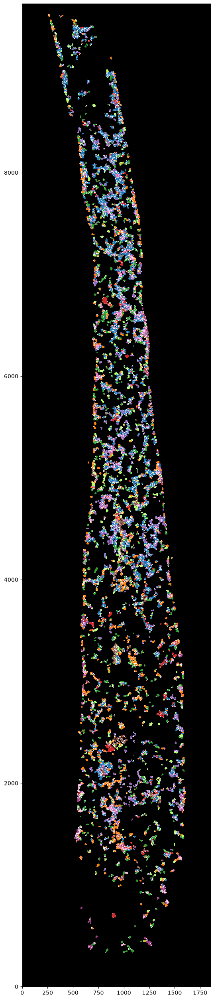

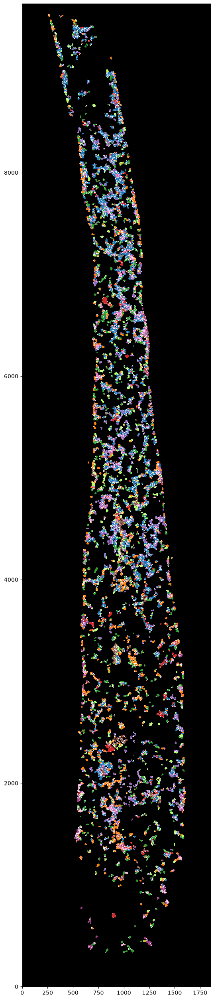

In [22]:
# 1. Create a clean, custom figure and axis layout
fig, ax = plt.subplots(1, 1, figsize=(8, 32))

# 2. Pass your explicit 'ax' to the plotting tool (DO NOT use plt.gca())
_ = (
    dat["test_EV"]
    .la.deselect(["Removed"])
    .pl.show(render_image=False, render_segmentation=True, render_labels=True, ax=ax)
)

# 3. Clean up the legend from your active axis handle
if ax.get_legend():
    ax.get_legend().remove()

# 4. Save your active figure directly to your figures directory
fig.savefig(
    "../figures/revision/F3/F3A_EV.png",
    dpi=900,
    bbox_inches="tight",
)

# 5. Display the final figure layout in your Jupyter Notebook
fig

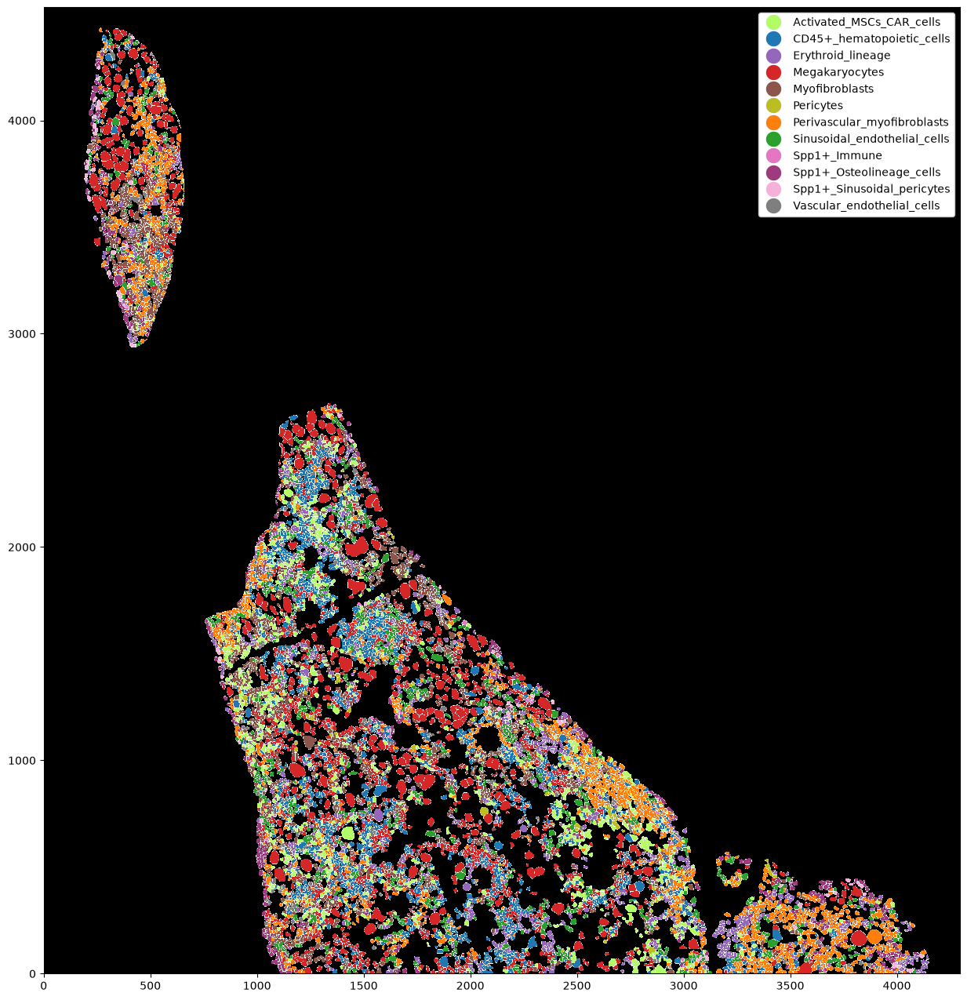

In [23]:
plt.figure(figsize=(16, 16))
_ = (
    dat["test_Thpo"]
    .la.deselect(["Removed"])
    .pl.show(render_image=False, render_segmentation=True, render_labels=True, ax=plt.gca())
)

In [24]:
####################### Subset in ROIs

In [25]:
## ROI 1

In [26]:
sub1=dat['test_Thpo'].pp[50:800, 2800:4800]

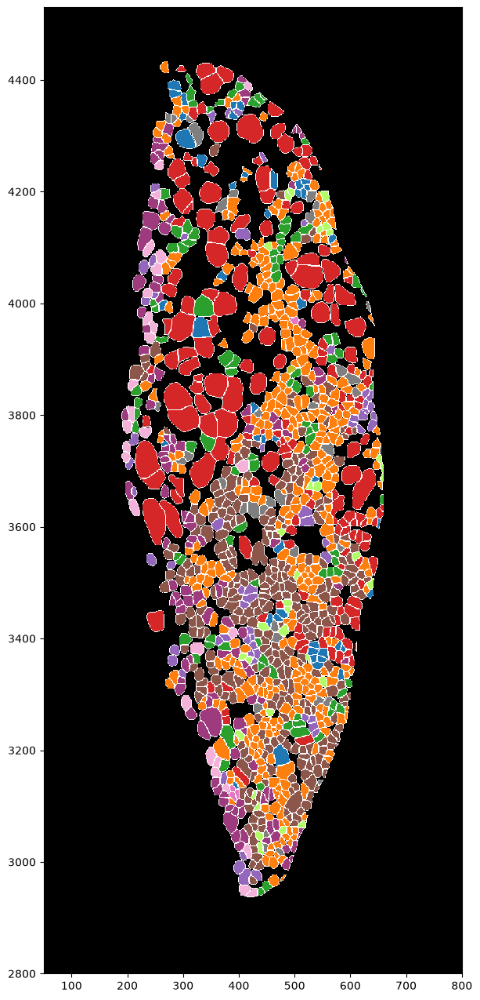

<Figure size 640x480 with 0 Axes>

In [27]:
fig, ax = plt.subplots(1, 1, figsize=(10, 16))
plt.close(fig)

_=sub1.la.deselect(["Removed"]).pl.show(render_image=False, render_segmentation=True, render_labels=True, ax=ax)
if ax.get_legend():
    ax.get_legend().remove()
plt.savefig('../figures/revision/F3/F3A_TPO.png', dpi=900)
fig

In [28]:
CTs_ThPO=pd.read_csv('../res_data/revision/CODEX/cell_features_run46_Thpo_2.csv', index_col=0)

In [29]:
sub1_cellids=list(pd.Series(sub1.cells))

In [30]:
## Extract cell types and cell ids from ROI
sub1_df=CTs_ThPO[[i in sub1_cellids for i in CTs_ThPO.cell]]
sub1_df.to_csv('../res_data/revision/CODEX/ROI1_ThPO_final.csv')

In [31]:
## ROI 2

In [32]:
sub1=dat['test_Thpo'].pp[2000:3200, 600:1600]

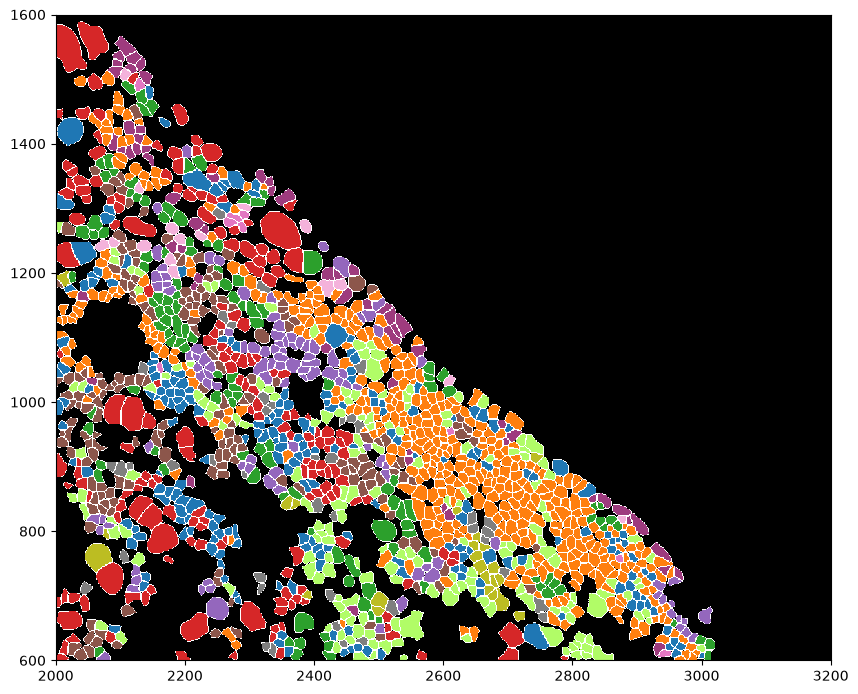

<Figure size 640x480 with 0 Axes>

In [33]:
fig, ax = plt.subplots(1, 1, figsize=(10, 16))
plt.close(fig)

_=sub1.la.deselect(["Removed"]).pl.show(render_image=False, render_segmentation=True, render_labels=True, ax=ax)
if ax.get_legend():
    ax.get_legend().remove()
plt.savefig('../figures/revision/F3/F3C.png', dpi=900)
fig

In [34]:
sub1_cellids=list(pd.Series(sub1.cells))

In [35]:
## Extract cell types and cell ids from ROI
sub1_df=CTs_ThPO[[i in sub1_cellids for i in CTs_ThPO.cell]]
sub1_df.to_csv('../res_data/revision/CODEX/ROI2_ThPO_final.csv')

In [36]:
## ROI 3

In [37]:
sub1=dat['test_Thpo'].pp[3100:4200, 0:600]

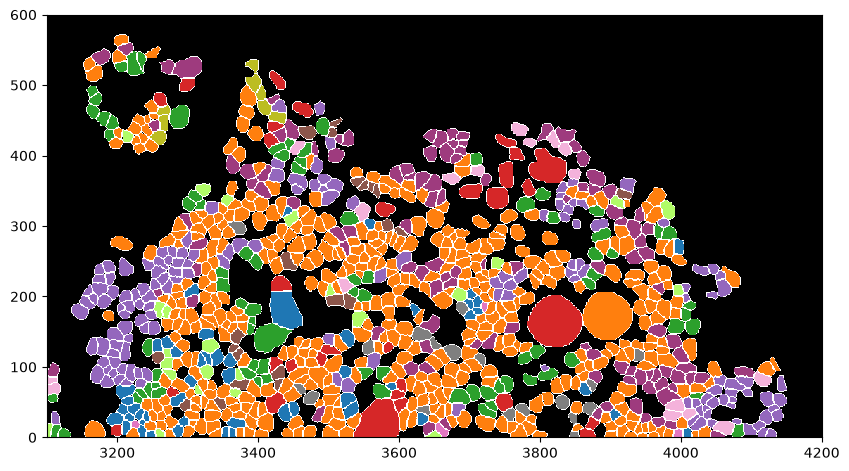

In [38]:
fig, ax = plt.subplots(1, 1, figsize=(10, 16))
plt.close(fig)

_=sub1.la.deselect(["Removed"]).pl.show(render_image=False, render_segmentation=True, render_labels=True, ax=ax)
if ax.get_legend():
    ax.get_legend().remove()
fig

In [39]:
sub1_cellids=list(pd.Series(sub1.cells))

In [40]:
## Extract cell types and cell ids from ROI
sub1_df=CTs_ThPO[[i in sub1_cellids for i in CTs_ThPO.cell]]
sub1_df.to_csv('../res_data/revision/CODEX/ROI3_ThPO_final.csv')

In [41]:
#### Plot (and filter) protein intensities

In [42]:
## high value filtering
def filter_high(ds, q=0.99):
    # Calculate cutoff for each channel
    cutoff = ds.quantile(q, dim=["x", "y"])
    # Keep values below cutoff, otherwise set to 0
    return ds.where(ds <= cutoff, 0)

In [43]:
def filter_high_multi(ds, quantiles=[0.99, 0.95]):
    """
    Applies high-value filtering using a list of quantiles.
    quantiles: list of floats, one per channel in the image.
    """
    # Target the internal image variable
    img_var = '_image' if '_image' in ds.data_vars else 'image'
    
    # Loop through the channels by index
    for i, q in enumerate(quantiles):
        # 1. Get the channel by index (0, 1, 2...)
        channel_slice = ds[img_var].isel(channels=i)
        # 2. Calculate the specific cutoff for this channel
        cutoff = channel_slice.quantile(q).compute()
        # 3. Apply the filter directly to the dataset
        ds[img_var].loc[dict(channels=ds.channels.values[i])] = channel_slice.where(channel_slice <= cutoff, 0)
        
    return ds

In [44]:
list(dat['test_Thpo'].channels.to_dataframe().index)

['DAPI',
 '33 CD45',
 '80 Sca1',
 '128 Na K ATPase',
 '38 Ter119',
 '32 CD31',
 '149 Endomucin',
 '11 aSMA',
 '40 Podoplanin',
 '84 NCAM',
 '82 Vimentin',
 '51 CD146',
 'Osteopontin 166',
 '29 CD106',
 '158 VE Cadherin',
 '127 CD61',
 '103 CXCL12',
 'CD71 133',
 'Col1a 19']

In [45]:
## based on Collagen and DAPI
def filter_bone(ds, filts=[0,1], cutoffs_q=[0.5,0.9]):
    """
    Bone filtering
    """
    # Target the internal image variable
    img_var = '_image' if '_image' in ds.data_vars else 'image'
    f1_slice=ds[img_var].isel(channels=filts[0])
    f2_slice=ds[img_var].isel(channels=filts[1])
    ## new
    f1_slice_cut=f1_slice.quantile(cutoffs_q[0]).compute()
    f2_slice_cut=f2_slice.quantile(cutoffs_q[1]).compute()
    ##
    # Loop through the channels by index
    for i, q in enumerate(list(ds.channels.to_dataframe().index)):
        # 1. Get the channel by index (0, 1, 2...)
        channel_slice = ds[img_var].isel(channels=i)
        # 3. Apply the filter directly to the dataset
        ds[img_var].loc[dict(channels=ds.channels.values[i])] = channel_slice.where(f1_slice >= f1_slice_cut, 0)
        ds[img_var].loc[dict(channels=ds.channels.values[i])] = channel_slice.where(f2_slice <= f2_slice_cut, 0)
        
    return ds

In [46]:
ds=dat['test_Thpo'].pp[["DAPI", "Col1a 19", "127 CD61", "11 aSMA", "103 CXCL12","Osteopontin 166", "33 CD45"]]

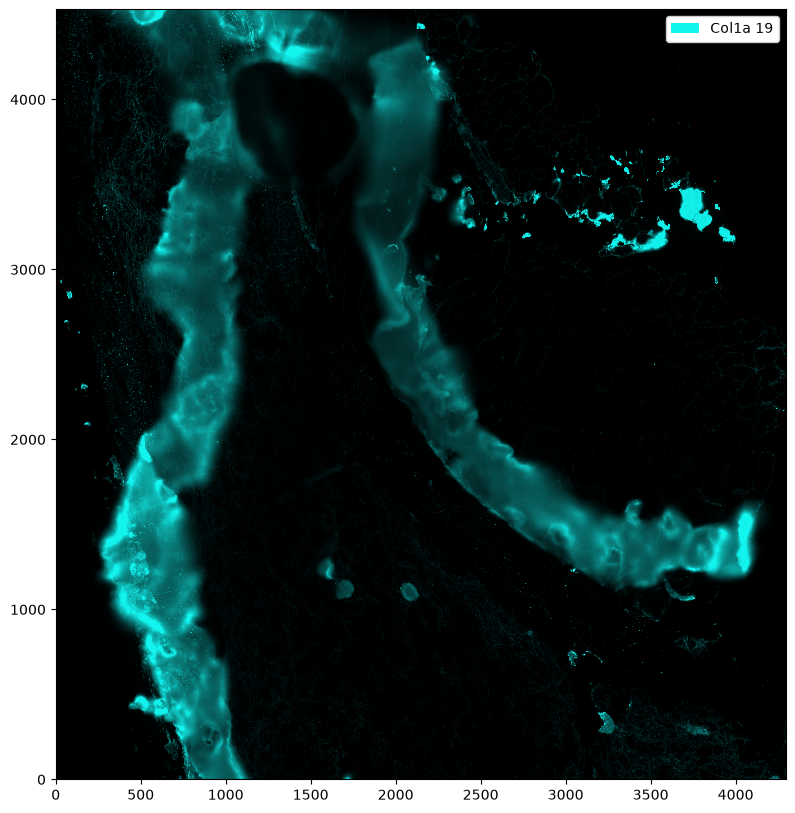

In [47]:
plt.figure(figsize=(10, 10))
_ = (ds.pp[["Col1a 19"]].pl.colorize(["#13F4EF"])
                   .pl.show())

In [48]:
ds=ds.pipe(filter_bone, cutoffs_q=[0.5,0.75])

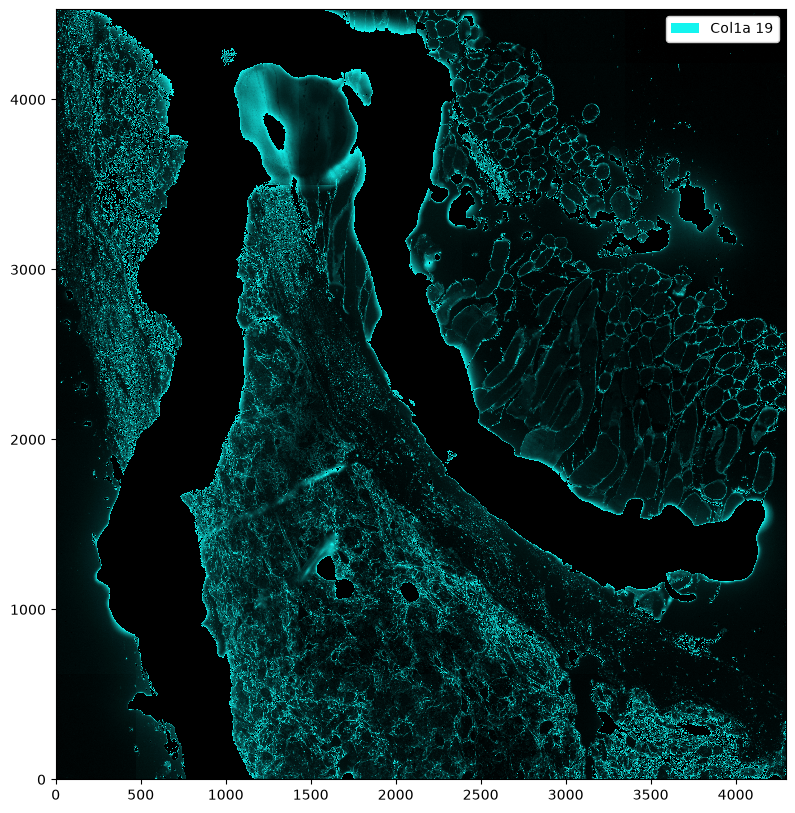

In [49]:
plt.figure(figsize=(10, 10))
_ = (ds.pp[["Col1a 19"]].pl.colorize(["#13F4EF"])
                   .pl.show())

In [50]:
## Colors per protein
cols1=['#0072B2', '#00FF2B', '#13F4EF']
cols2=['#CC79A7', '#FFD700']

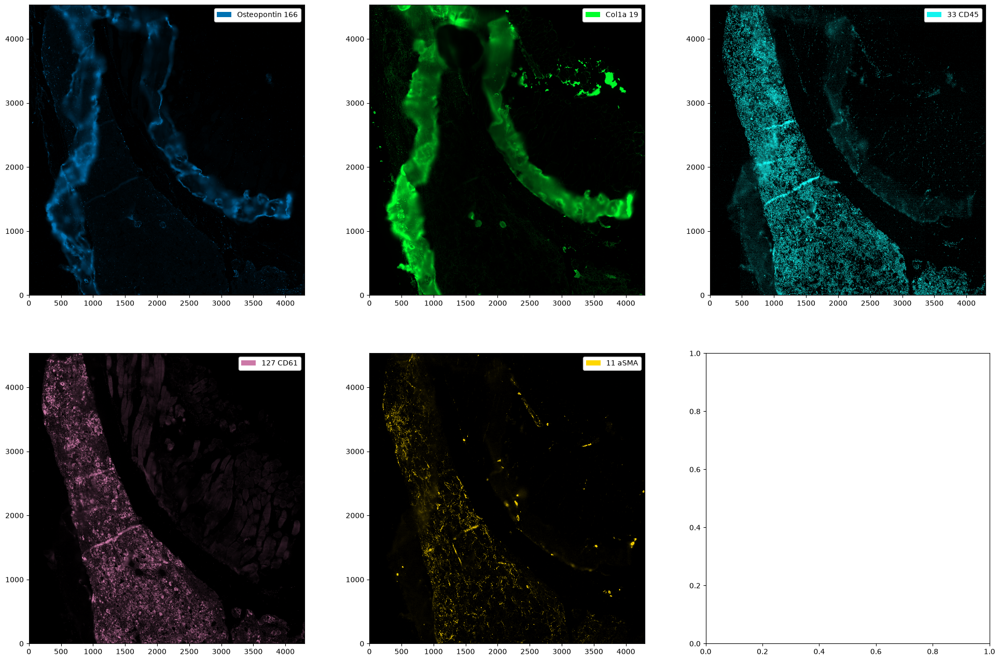

In [51]:
### Raw
fig, ax = plt.subplots(2, 3, figsize=(24, 16))
plt.close(fig)

for idu,mkr in enumerate(['Osteopontin 166','Col1a 19', '33 CD45']):
    _ = (dat['test_Thpo'].pp[[mkr]]
                   .pl.colorize([cols1[idu]])
                   .pl.show(ax=ax[0][idu]))
for idu,mkr in enumerate(['127 CD61', '11 aSMA']):
    _ = (dat['test_Thpo'].pp[[mkr]]
                   .pl.colorize([cols2[idu]])
                   .pl.show(ax=ax[1][idu]))

fig


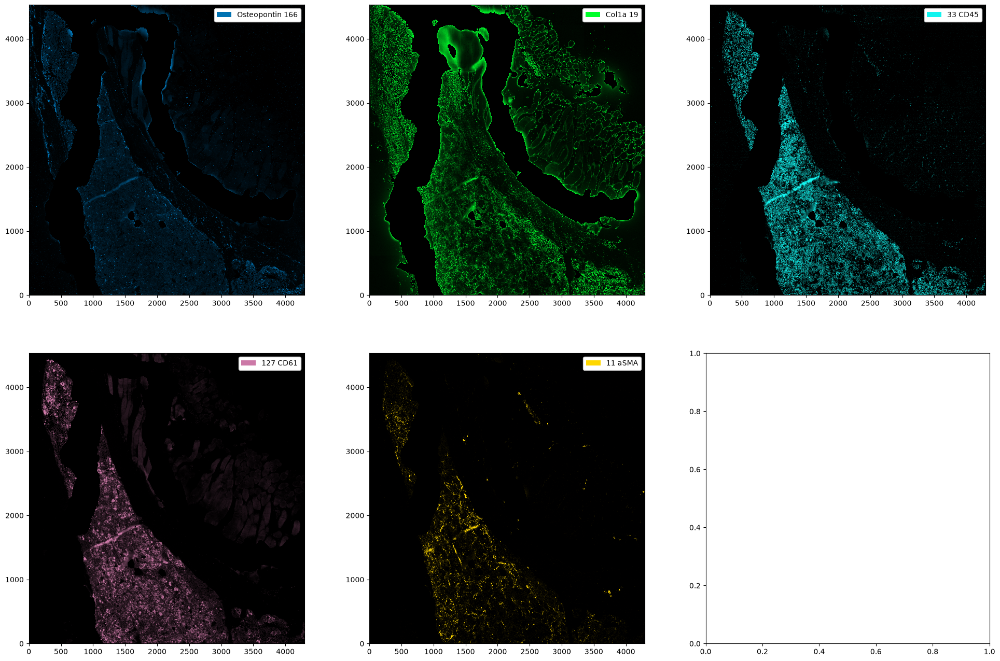

In [52]:
### Bone filter
fig, ax = plt.subplots(2, 3, figsize=(24, 16))
plt.close(fig)

for idu,mkr in enumerate(['Osteopontin 166', 'Col1a 19', '33 CD45']):
    _ = (ds.pp[[mkr]]
         .pl.colorize([cols1[idu]])
         .pl.show(ax=ax[0][idu]))
for idu,mkr in enumerate(['127 CD61', '11 aSMA']):
    _ = (ds.pp[[mkr]]
         .pl.colorize([cols2[idu]])
         .pl.show(ax=ax[1][idu]))

fig


In [53]:
### High and low intensity thresholds
filt_high1=[0.99, 0.99,0.99]
filt_high2=[1, 0.99]
thr1=[0.9, 0.9, 0.9]
thr2=[0.9, 0.9]

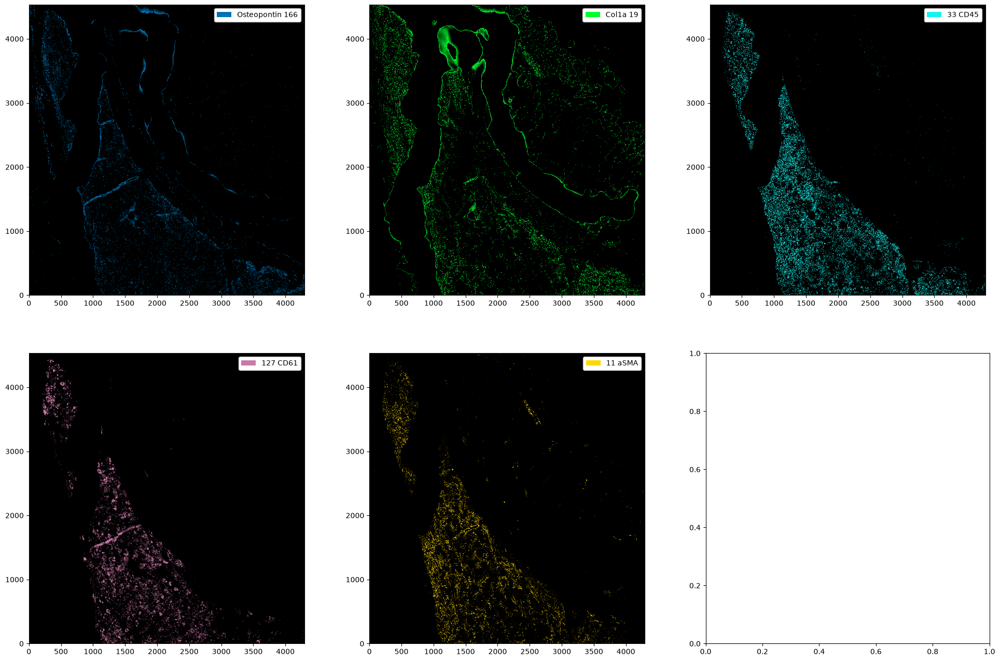

In [54]:
### Filtered

fig, ax = plt.subplots(2, 3, figsize=(24, 16))
plt.close(fig)

for idu,mkr in enumerate(['Osteopontin 166', 'Col1a 19', '33 CD45']):
    _ = (ds.pp[[mkr]]
         .pipe(filter_high, q=filt_high1[idu]) 
         .pp.threshold(quantile=thr1[idu]) 
         .pl.colorize([cols1[idu]])
         .pl.show(ax=ax[0][idu]))
for idu,mkr in enumerate(['127 CD61', '11 aSMA']):
    _ = (ds.pp[[mkr]]
         .pipe(filter_high, q=filt_high2[idu]) 
         .pp.threshold(quantile=thr2[idu]) 
         .pl.colorize([cols2[idu]])
         .pl.show(ax=ax[1][idu]))

fig


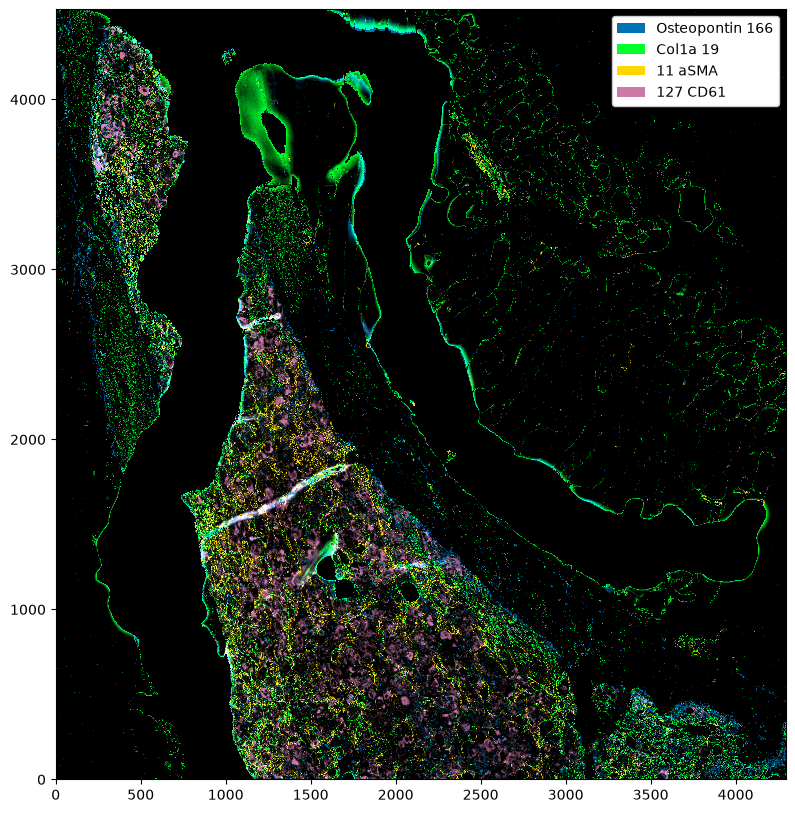

In [55]:
plt.figure(figsize=(10, 10))
_ = (ds.pp[["Osteopontin 166", "Col1a 19", "11 aSMA", '127 CD61']]
                   .pipe(filter_high_multi, quantiles=[0.99, 0.99, 0.99, 1])
                   .pp.threshold(quantile=[0.9, 0.9, 0.9, 0.9])
                   .pl.colorize(['#0072B2', '#00FF2B', '#FFD700', '#CC79A7'])
                   .pl.show())

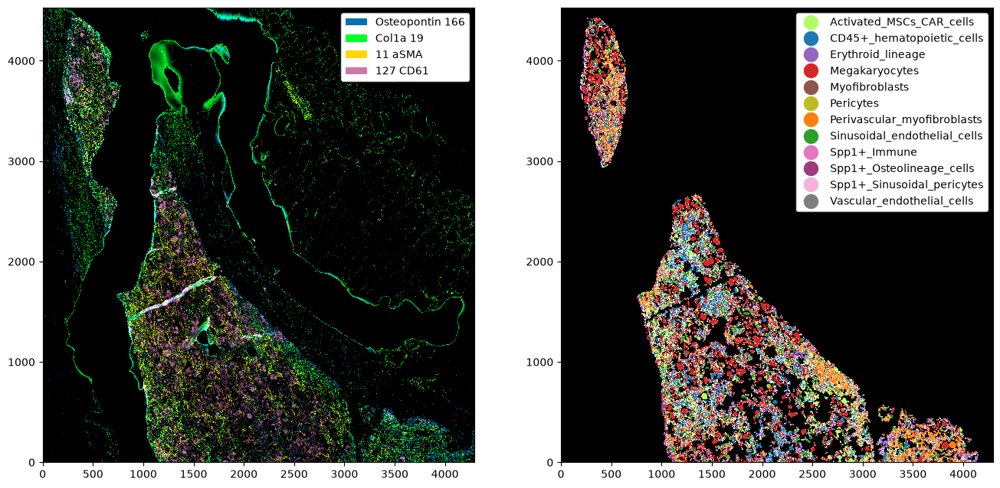

In [56]:
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
_ = (ds.pp[["Osteopontin 166", "Col1a 19", "11 aSMA", '127 CD61']]
                   .pipe(filter_high_multi, quantiles=[0.99, 0.99, 0.99, 1])
                   .pp.threshold(quantile=[0.9, 0.9, 0.9, 0.9])
                   .pl.colorize(['#0072B2', '#00FF2B', '#FFD700', '#CC79A7']).pl.show(ax=ax[0])
)

_ = (
    dat['test_Thpo']
    .la.deselect(["Removed"])
    .pl.show(render_image=False, render_labels=True, ax=ax[1], render_segmentation=True)
)

In [57]:
#fig.savefig('../figures/revision/mks_filtered_merge_Thpo_Col1a.png', dpi=1200)

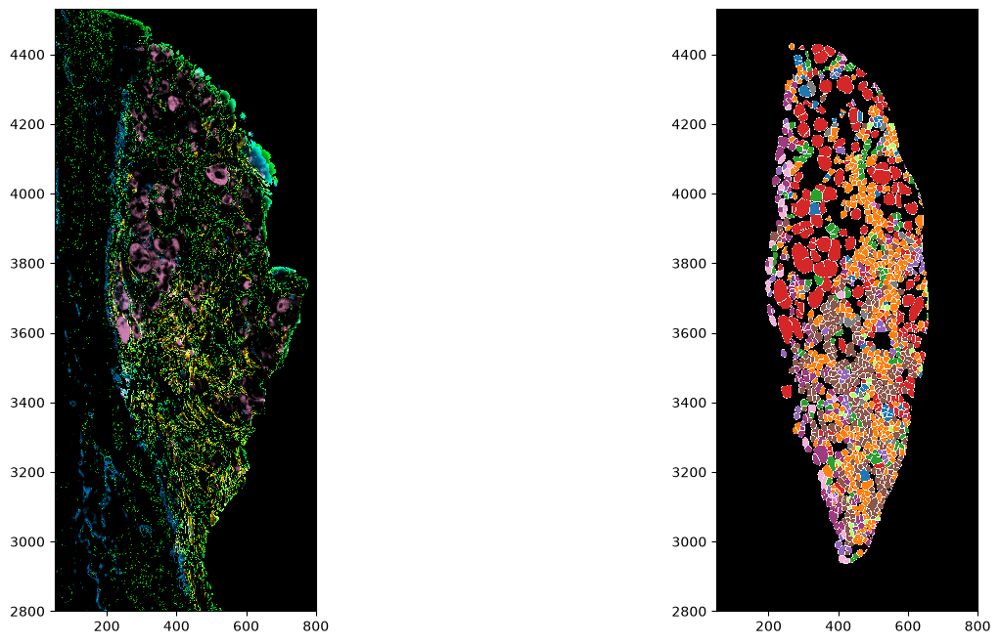

In [58]:
### ROI 1
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
_ = (ds.pp[["Osteopontin 166", "Col1a 19", "11 aSMA", '127 CD61']].pp[50:800, 2800:4800]
                   .pipe(filter_high_multi, quantiles=[0.99, 0.99, 0.99, 1])
                   .pp.threshold(quantile=[0.9, 0.9, 0.9, 0.9])
                   .pl.colorize(['#0072B2', '#00FF2B', '#FFD700', '#CC79A7']).pl.show(ax=ax[0])
)

_ = (
    dat['test_Thpo'].pp[50:800, 2800:4800]
    .la.deselect(["Removed"])
    .pl.show(render_image=False, render_labels=True, ax=ax[1], render_segmentation=True)
)

if ax[0].get_legend():
    ax[0].get_legend().remove()

if ax[1].get_legend():
    ax[1].get_legend().remove()
    

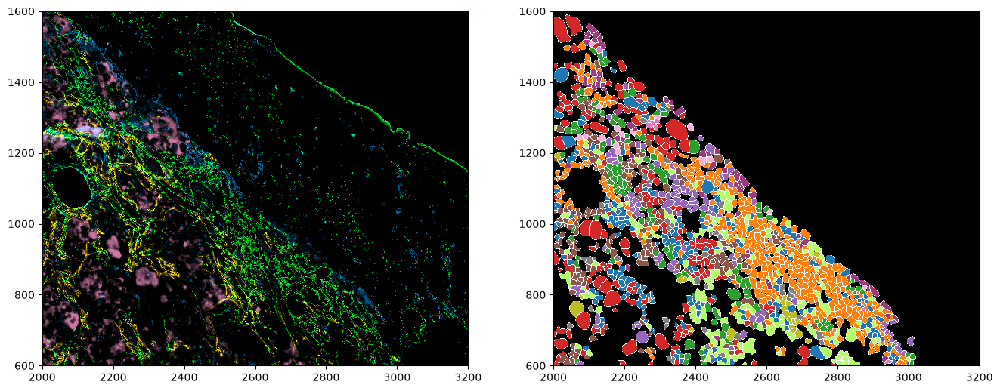

In [59]:
### ROI 2
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
_ = (ds.pp[["Osteopontin 166", "Col1a 19", "11 aSMA", '127 CD61']].pp[2000:3200, 600:1600]
                   .pipe(filter_high_multi, quantiles=[0.99, 0.99, 0.99, 1])
                   .pp.threshold(quantile=[0.9, 0.9, 0.9, 0.9])
                   .pl.colorize(['#0072B2', '#00FF2B', '#FFD700', '#CC79A7']).pl.show(ax=ax[0])
)

_ = (
    dat['test_Thpo'].pp[2000:3200, 600:1600]
    .la.deselect(["Removed"])
    .pl.show(render_image=False, render_labels=True, ax=ax[1], render_segmentation=True)
)

if ax[0].get_legend():
    ax[0].get_legend().remove()

if ax[1].get_legend():
    ax[1].get_legend().remove()
    
#fig.savefig('../figures/revision/F3/F3CD.png', dpi=1200)

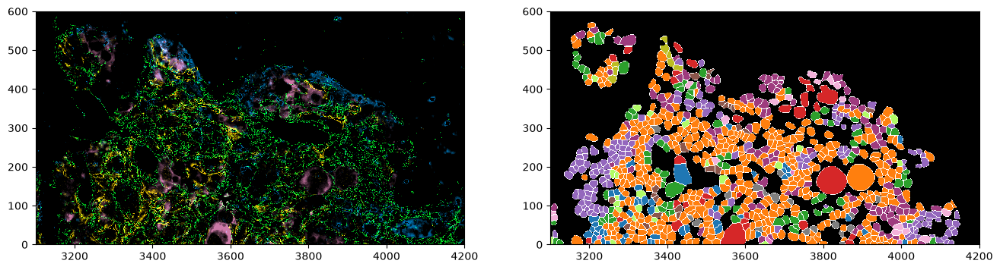

In [60]:
### ROI 3
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

_ = (ds.pp[["Osteopontin 166", "Col1a 19", "11 aSMA", '127 CD61']].pp[3100:4200, 0:600]
                   .pipe(filter_high_multi, quantiles=[0.99, 0.99, 0.99, 1])
                   .pp.threshold(quantile=[0.9, 0.9, 0.9, 0.9])
                   .pl.colorize(['#0072B2', '#00FF2B', '#FFD700', '#CC79A7']).pl.show(ax=ax[0])
)

_ = (
    dat['test_Thpo'].pp[3100:4200, 0:600]
    .la.deselect(["Removed"])
    .pl.show(render_image=False, render_labels=True, ax=ax[1], render_segmentation=True)
)

if ax[0].get_legend():
    ax[0].get_legend().remove()

if ax[1].get_legend():
    ax[1].get_legend().remove()
    